## Adriano Cicco Group L

## Steam dataset

Link dataset:
https://www.kaggle.com/datasets/trolukovich/steam-games-complete-dataset

Questo dataset contiene dati relativi a steam, una piattaforma per la vendita di videogames.

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
df = pd.read_csv("data/steam_games.csv")


## trasforma il campo release_date in datetime

In [2]:
dfrelease_date=df

In [3]:
dfrelease_date["release_date"]=pd.to_datetime(dfrelease_date["release_date"], format='%b %d, %Y', errors='coerce')
dfrelease_date = dfrelease_date.dropna(subset=['release_date'])
#fil=df["release_date"].str.contains('/', regex=False).fillna(False)
#df[fil]

In [4]:
df_time=dfrelease_date.sort_values(by='release_date')
#df_time

## numero di giochi negli anni

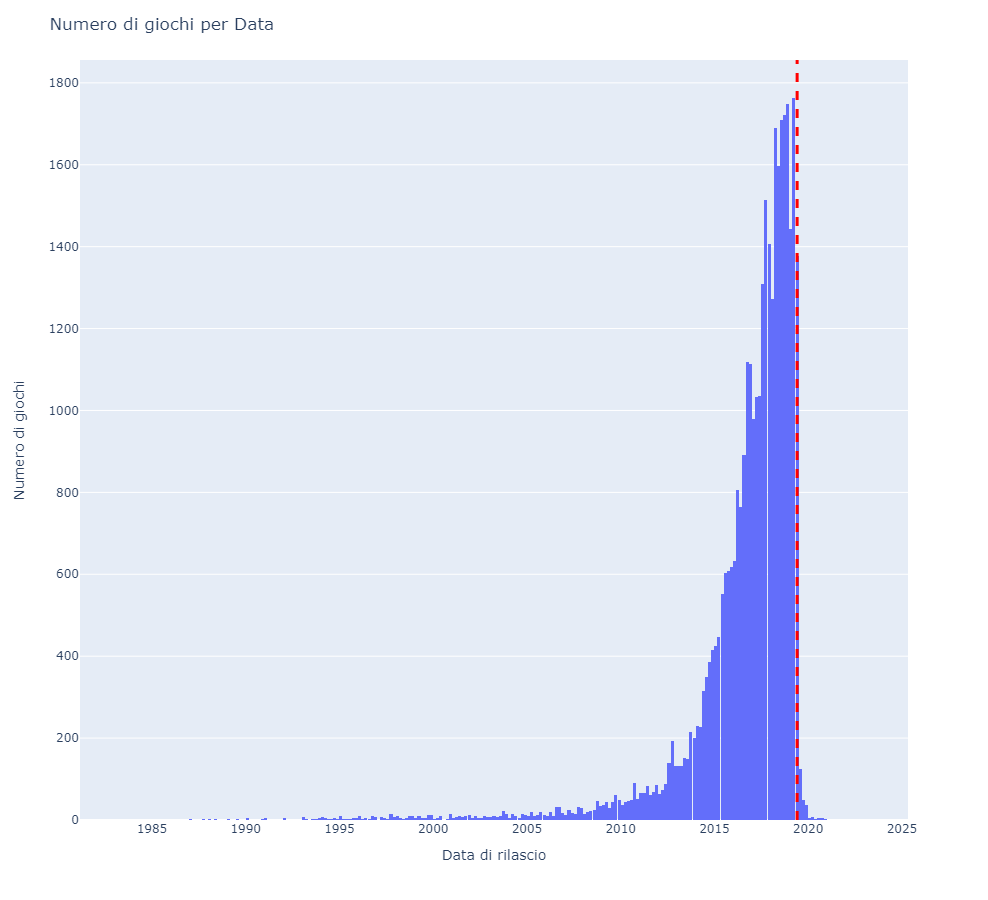

In [5]:
fig= px.histogram(df_time,x="release_date", height=900)
fig.update_layout(
    title="Numero di giochi per Data",
    xaxis_title="Data di rilascio",
    yaxis_title="Numero di giochi",
)
fig.add_vline(x='2019-06-01', line_width=3, line_dash="dash", line_color="red")

fig.show()

## Inizio analisi linguistica

In [6]:

df1=df
df1['languages']= df1['languages'].str.replace(" ","")
#df1['languages']
#df1 = df1.join(df1.languages.str.get_dummies(sep=','))

In [7]:
dflanguages= df.dropna(subset=['languages'])

dflanguages["languages"]=dflanguages["languages"].str.split(",")
#dflanguages["languages"]
#pd.DataFrame(dflanguages['languages'].values.tolist(), index=dflanguages.index)

C:\Users\adria\AppData\Local\Temp\ipykernel_41040\3819021959.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [8]:

dflanguagesExplode=dflanguages.explode('languages')
#dflanguagesExplode= dflanguagesExplode.groupby('languages')
dfgroup= dflanguagesExplode.groupby('languages')['name'].count()
dfgroup=dfgroup.sort_values(ascending=False).to_frame(name="count")
dfgroup=dfgroup.loc[dfgroup['count']>5,:].head(10)

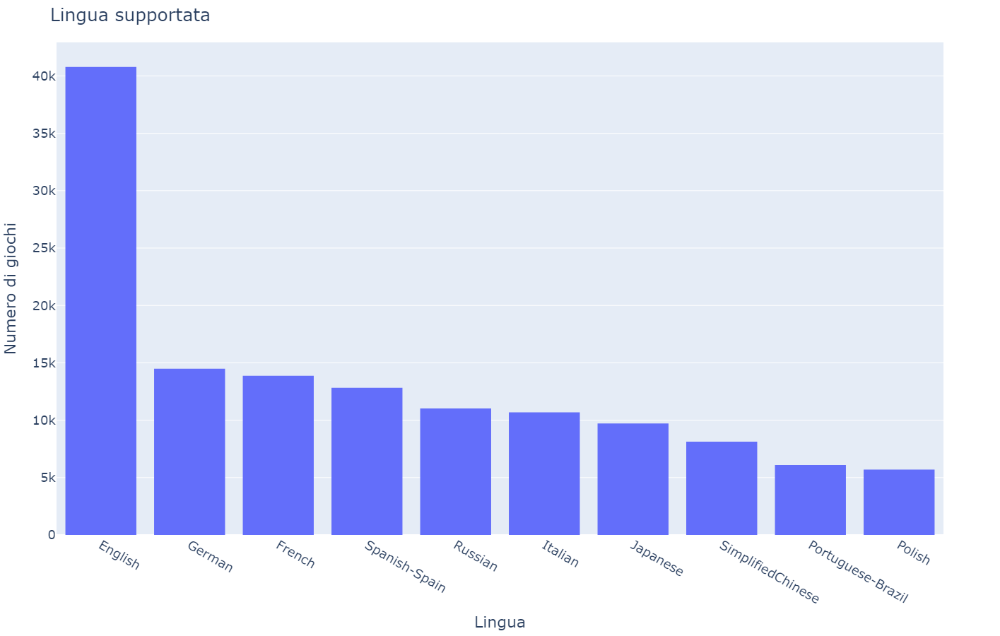

In [9]:
fig = px.histogram(dfgroup,x=dfgroup.index,y="count", height=900)

fig.update_layout(
    title="Lingua supportata",
    xaxis_title="Lingua",
    yaxis_title="Numero di giochi",
    font=dict(
        size=18,
    )
)

fig.show()

In [10]:
filteredPrice=df
filteredPrice=filteredPrice.dropna(subset=['original_price'])
filteredPrice=filteredPrice.loc[filteredPrice["original_price"].str.contains("$")|filteredPrice["original_price"].str.contains("Free") ,:]
filteredPrice['original_price'] = filteredPrice['original_price'].dropna().str.replace("$","",regex=True).dropna().str.replace("$","",regex=True)
#filteredPrice['original_price'] = filteredPrice['original_price'].dropna().str.replace("$","",regex=True).dropna().str.replace("$","",regex=True)
filteredPrice=filteredPrice.dropna(subset=['original_price'])
filteredPrice.loc[filteredPrice["original_price"].str.contains("Free"),:]='0'
filteredPrice['original_price']=pd.to_numeric(filteredPrice['original_price'],errors='coerce')
filteredPrice=filteredPrice.dropna(subset=['original_price']).loc[filteredPrice['original_price']<10000,:]
filteredPrice.sort_values(by="original_price",ascending=True)

,url,types,name,desc_snippet,recent_reviews,all_reviews,release_date,developer,publisher,popular_tags,game_details,languages,achievements,genre,game_description,mature_content,minimum_requirements,recommended_requirements,original_price,discount_price
16857,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0
8094,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0
11470,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0
8095,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0
29534,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33167,https://store.steampowered.com/app/1054220/Cra...,app,Crankies Workshop: Grizzbot Assembly 2 Wall Pa...,NaN,NaN,NaN,2019-03-21 00:00:00,Crankies Smartworks,"VT Publishing,VT Publishing","Casual,Strategy,Action,Indie,Simulation","Single-player,Downloadable Content,Steam Achie...",English,NaN,"Action,Casual,Indie,Simulation,Strategy",About This Content Crankies Workshop: Grizzb...,NaN,NaN,NaN,624.74,$10.47
33166,https://store.steampowered.com/app/1054230/Cra...,app,Crankies Workshop: Grizzbot Assembly 2 Sound T...,NaN,NaN,NaN,2019-03-21 00:00:00,Crankies Smartworks,"VT Publishing,VT Publishing","Casual,Simulation,Indie,Action,Strategy","Single-player,Downloadable Content,Steam Achie...",English,NaN,"Action,Casual,Indie,Simulation,Strategy",About This Content Crankies Workshop: Grizzb...,NaN,NaN,NaN,624.74,$10.47
40235,https://store.steampowered.com/sub/354233/,sub,Valve Index Headset + Controllers,Valve Index Headset + Controllers bundle,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,749.00,NaN
38148,https://store.steampowered.com/app/719000/Stra...,app,Strata Spaces VR – Professional Edition Upgrade,NaN,NaN,NaN,2017-10-26 00:00:00,"Strata Mixed Reality, Inc.","Strata Mixed Reality, Inc.,Strata Mixed Realit...","Design & Illustration,Animation & Modeling","Downloadable Content,Steam Achievements,Steam ...",English,NaN,"Animation & Modeling,Design & Illustration",About This Content Strata Spaces VR is the ul...,NaN,"Minimum:,OS:,Windows™ 8.1 or later or Windows™...","Recommended:,OS:,Windows™ 8.1 or later or Wind...",995.00,NaN


## distribuzione dei prezzi

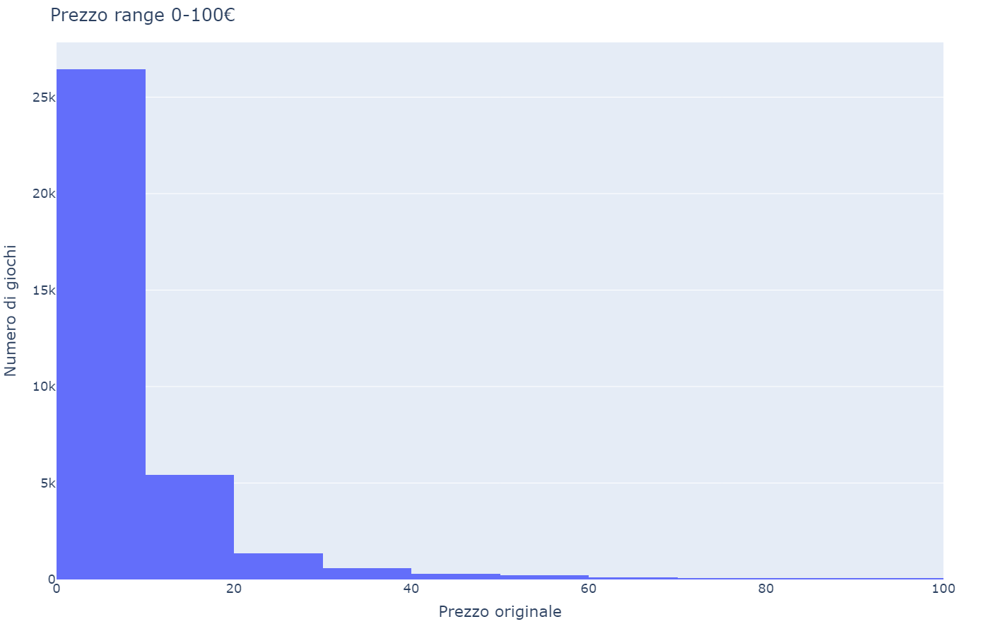

In [11]:

fig= px.histogram(filteredPrice,x='original_price', height=900,nbins=150)

fig.update_layout(
    title="Prezzo range 0-100€",
    xaxis_title="Prezzo originale",
    yaxis_title="Numero di giochi",
    xaxis_range=[0,100],
    font=dict(
        size=18,
    )
)

fig.show()

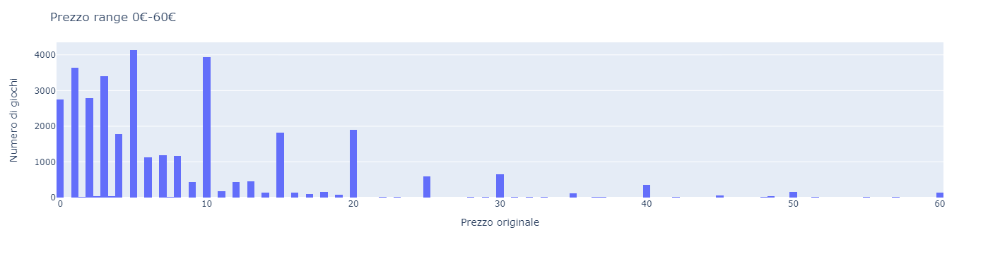

In [12]:
fig=px.histogram(filteredPrice.loc[filteredPrice['original_price']<60,:],x='original_price')

fig.update_layout(
    title="Prezzo range 0€-60€",
    xaxis_title="Prezzo originale",
    yaxis_title="Numero di giochi",
)

fig.show()

## Top 11 generi più diffusi

In [13]:
dfgenre=df
dfgenre= df.dropna(subset=['genre'])

dfgenre["genre"]=dfgenre["genre"].astype(str)
dfgenre["genre"]=dfgenre["genre"].str.split(",")
dfgenreExplode=dfgenre.explode('genre')

dfgroup= dfgenreExplode.groupby('genre')['name'].count()
dfgroup=dfgroup.sort_values(ascending=False).to_frame(name="count")

#dfgroup=dfgroup.loc[dfgroup['count']>5,:]



C:\Users\adria\AppData\Local\Temp\ipykernel_41040\1999937640.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\adria\AppData\Local\Temp\ipykernel_41040\1999937640.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [14]:
dfgroupGenre=dfgroup.head(11)

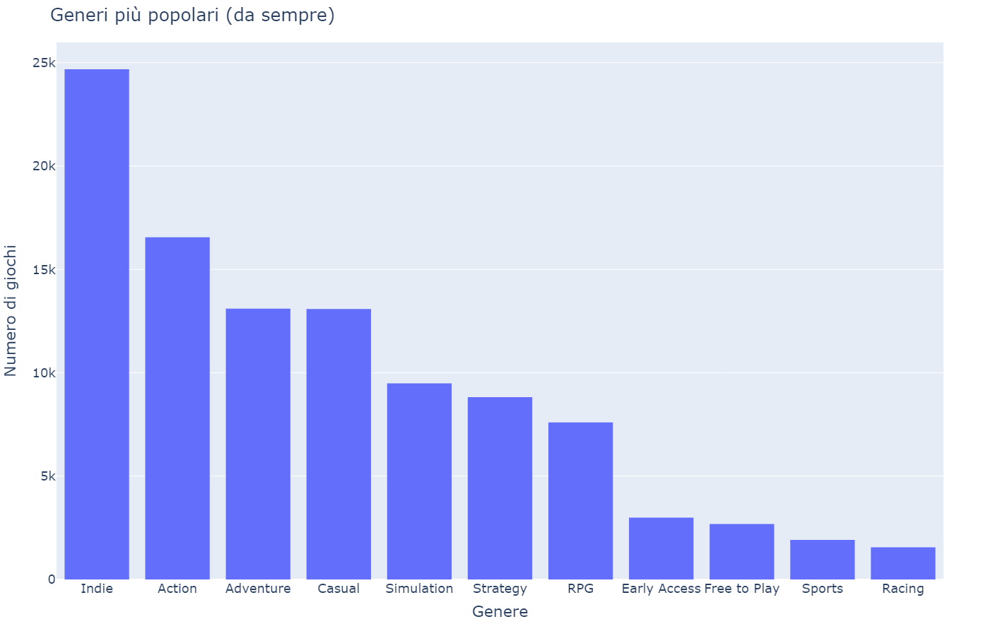

In [15]:
fig= px.histogram(dfgroupGenre,x=dfgroupGenre.index,y="count", height=900)

fig.update_layout(
    title="Generi più popolari (da sempre)",
    xaxis_title="Genere",
    yaxis_title="Numero di giochi",
    font=dict(
        size=18,
    )
)

fig.show()

## Crescita del multiplayer negli anni

Analizzare la percentuale di tag multiplayer in confronto di quelli single player

In [16]:
dfgame_details=df
dfgame_details= df.dropna(subset=['game_details'])

dfgame_details["game_details"]=dfgame_details["game_details"].astype(str)
dfgame_details["game_details"]=dfgame_details["game_details"].str.split(",")
dfgame_details["release_date"]=pd.to_datetime(dfgame_details["release_date"], format='%b %d, %Y', errors='coerce')
dfgame_details = dfgame_details.dropna(subset=['release_date'])
dfgame_details["year"]=dfgame_details["release_date"].dt.year
dfgame_details=dfgame_details.loc[dfgame_details["year"]<2019,:]

dfgame_detailsExplode=dfgame_details.explode('game_details')



dfgroup= dfgame_detailsExplode.groupby('game_details')['name'].count()
dfgroup=dfgroup.sort_values(ascending=False).to_frame(name="count")
print(dfgroup)

dfgroup.index= dfgroup.index.map(str)
dfgroup=dfgroup.loc[dfgroup.index.str.contains("online", case=False)|dfgroup.index.str.contains("Local", case=False),:]


dfgame_detailsExplode=pd.merge(dfgroup, dfgame_detailsExplode, on='game_details')


#dfgroup=dfgroup.loc[dfgroup['count']>5,:]


C:\Users\adria\AppData\Local\Temp\ipykernel_41040\391998573.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\adria\AppData\Local\Temp\ipykernel_41040\391998573.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\adria\AppData\Local\Temp\ipykernel_41040\391998573.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-d

                                                    count
game_details                                             
Single-player                                       27816
Steam Achievements                                  16595
Downloadable Content                                11326
Steam Trading Cards                                 10636
Steam Cloud                                          9955
Full controller support                              7258
Multi-player                                         7072
Profile Features Limited \r\n\t\t\t\t\t\t\t\t\t      6311
Partial Controller Support                           5964
Steam Leaderboards                                   5437
Co-op                                                3683
Shared/Split Screen                                  3524
Online Multi-Player                                  3048
Cross-Platform Multiplayer                           2249
Stats                                                2248
Steam Workshop

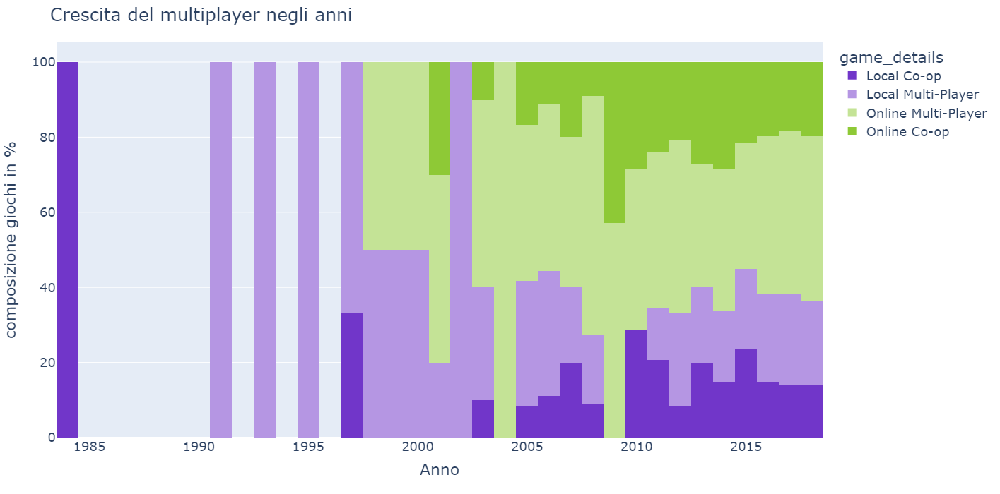

In [17]:
fig= px.histogram(dfgame_detailsExplode.sort_values(by="year"),x="year", color="game_details",height=700,barnorm = "percent",
            color_discrete_map={"Local Co-op": '#7136C9',"Online Co-op": '#8EC936',"Local Multi-Player":"#B596E3","Online Multi-Player":"#C4E396"})
fig.update_layout(
    title="Crescita del multiplayer negli anni",
    xaxis_title="Anno",
    yaxis_title="composizione giochi in %",
    font=dict(
        size=18,
    )
)
fig.show()

## distribuzione delle valutazioni

In [18]:

dfall_reviews=df
dfall_reviews=dfall_reviews.dropna(subset=['all_reviews'])
#print(dfall_reviews['all_reviews'])
dfall_reviews["all_reviews"]=dfall_reviews["all_reviews"].str.split(",")
dfall_reviews= dfall_reviews.loc[~dfall_reviews["all_reviews"].str[0].str.contains('user', regex=True, case=False),:]



dfall_reviews['grades']=dfall_reviews["all_reviews"].str[0]

dfgroup = dfall_reviews.groupby('grades')['name'].count()
dfgroup=dfgroup.sort_values(ascending=False).to_frame(name="count")

# dfgroup.loc[dfgroup.index=="Overwhelmingly Positive","value"]=1
# dfgroup.loc[dfgroup.index=="Very Positive","value"]=2
# dfgroup.loc[dfgroup.index=="Positive","value"]=3
# dfgroup.loc[dfgroup.index=="Mostly Positive","value"]=4

# dfgroup.loc[dfgroup.index=="Mixed","value"]=5


# dfgroup.loc[dfgroup.index=="Mostly Negative","value"]=6
# dfgroup.loc[dfgroup.index=="Negative","value"]=7
# dfgroup.loc[dfgroup.index=="Very Negative","value"]=8
# dfgroup.loc[dfgroup.index=="Overwhelmingly Negative","value"]=9

# dfgroup["value"] = dfgroup["value"].astype(str)
# dfgroup["value"] = dfgroup["value"].astype(float)
# dfgroup

C:\Users\adria\AppData\Local\Temp\ipykernel_41040\960027065.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\adria\AppData\Local\Temp\ipykernel_41040\960027065.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



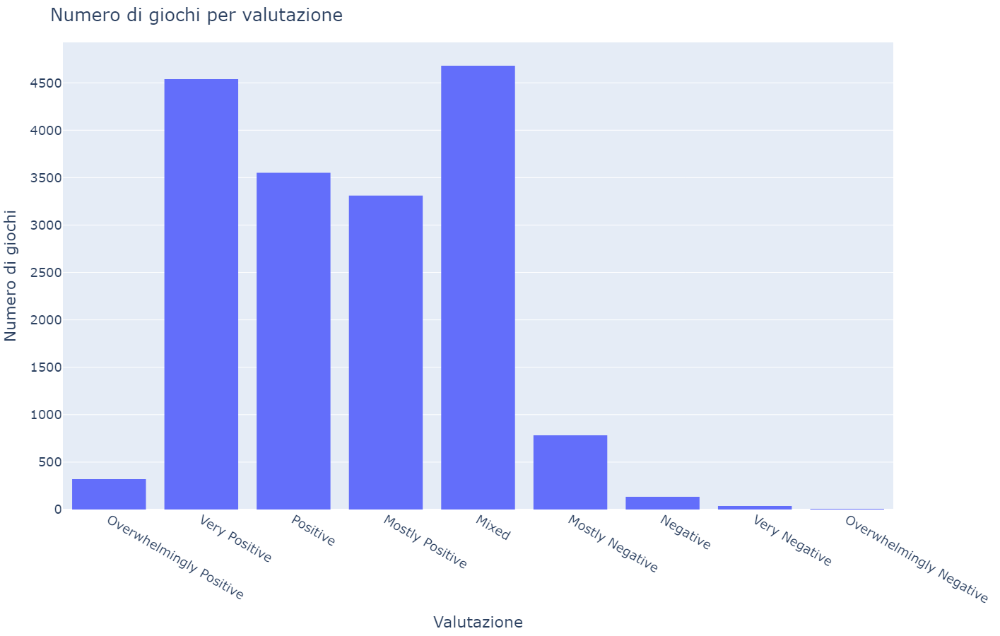

In [19]:
fig = px.histogram(dfgroup,
                   x=dfgroup.index,
                   y="count",
                   height=900,category_orders=dict(grades=["Overwhelmingly Positive", "Very Positive", "Positive", "Mostly Positive","Mixed" , "Mostly Negative","Negative","Very Negative","Overwhelmingly Negative"]),
                  )


fig.update_layout(
    title="Numero di giochi per valutazione",
    xaxis_title="Valutazione",
    yaxis_title="Numero di giochi",
    font=dict(
        size=18,
    )
)

fig.show()


In [20]:
dfall_reviewsWithGenre = dfall_reviews

In [21]:
#dfall_reviewsWithGenre= dfall_reviewsWithGenre.loc[~dfall_reviewsWithGenre["all_reviews"].str[0].str.contains('user', regex=True),:]
dfall_reviewsWithGenre["grades"]=dfall_reviewsWithGenre["all_reviews"].str[0]
dfall_reviewsWithGenre["grades"]

dfall_reviewsWithGenre= dfall_reviewsWithGenre.dropna(subset=['genre'])

dfall_reviewsWithGenre["genre"]=dfall_reviewsWithGenre["genre"].astype(str)
dfall_reviewsWithGenre["genre"]=dfall_reviewsWithGenre["genre"].str.split(",")
dfall_reviewsWithGenre=dfall_reviewsWithGenre.explode('genre')


#dfall_reviewsWithGenre
#dfgroup= dfgenreExplode.groupby('genre')['name'].count()
#dfgroup=dfgroup.sort_values(ascending=False).to_frame(name="count")
#dfgroup=dfgroup.loc[dfgroup['count']>5,:]



C:\Users\adria\AppData\Local\Temp\ipykernel_41040\2663438066.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\adria\AppData\Local\Temp\ipykernel_41040\2663438066.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\adria\AppData\Local\Temp\ipykernel_41040\2663438066.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

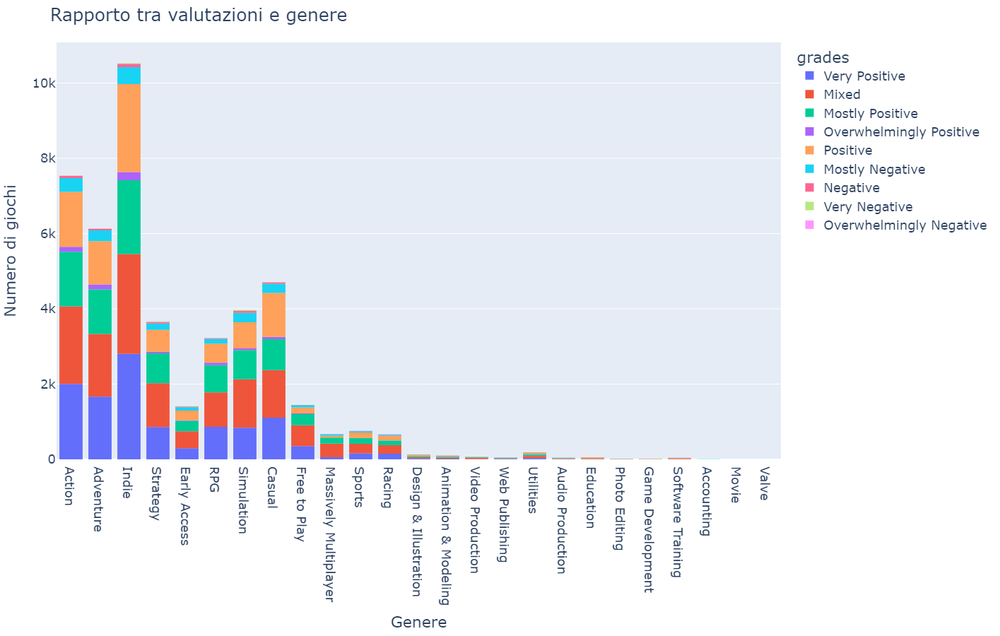

In [22]:
fig=px.histogram(dfall_reviewsWithGenre,x="genre", color="grades", height=900)

fig = px.histogram(dfall_reviewsWithGenre,x="genre", color="grades", height=900)
fig.update_layout(
    title="Rapporto tra valutazioni e genere",
    xaxis_title="Genere",
    yaxis_title="Numero di giochi",
    font=dict(
        size=18,
    )
)

fig.show()

## Rapporto tra valutazione e genere

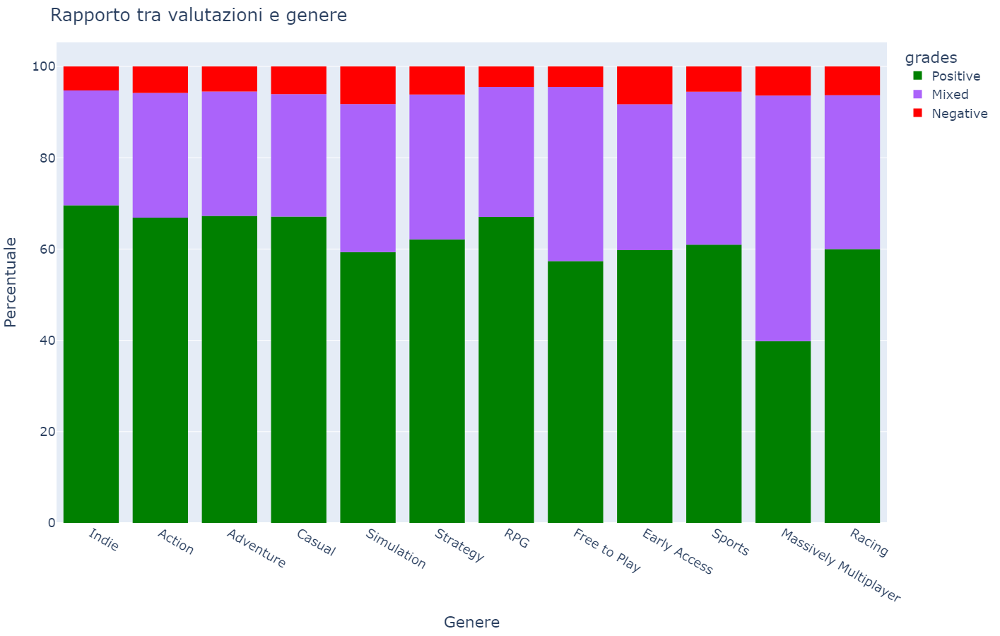

In [23]:

dfall_reviewsWithGenre.loc[dfall_reviewsWithGenre['grades'].str.contains('Positive', case=False),'grades']='Positive'
dfall_reviewsWithGenre.loc[dfall_reviewsWithGenre['grades'].str.contains('Negative', case=False),'grades']='Negative'

dfall_reviewsWithGenreTest=dfall_reviewsWithGenre.groupby(['genre'])['name'].count().reset_index(
  name='Count').sort_values(['Count'], ascending=False).head(12)

dfdfall_reviewsWithGenreFinish=pd.merge(dfall_reviewsWithGenre, dfall_reviewsWithGenreTest, on='genre')
dfdfall_reviewsWithGenreFinish=dfdfall_reviewsWithGenreFinish.loc[dfdfall_reviewsWithGenreFinish["Count"]>20,:].sort_values(by="Count", ascending=False)




#dfall_reviewsWithGenre.loc[dfall_reviewsWithGenre['grades'].str.contains('Positive', case=False),'Positive']=1
#dfall_reviewsWithGenre.loc[dfall_reviewsWithGenre['grades'].str.contains('Negative', case=False),'Negative']=1
#dfall_reviewsWithGenre.loc[dfall_reviewsWithGenre['grades'].str.contains('Mixed', case=False),'Mixed']=1


#dfall_reviewsWithGenreGroup=dfall_reviewsWithGenre.groupby("genre").count()
#print(dfall_reviewsWithGenre)
#dfall_reviewsWithGenreGroup.sort_values("")


#='Positive'
#dfall_reviewsWithGenre['grades']=dfall_reviewsWithGenre.loc[dfall_reviewsWithGenre['grades'].str.contains('negative'),:]['grades']='Negative'
fig = px.histogram(dfdfall_reviewsWithGenreFinish,x="genre", color="grades", height=900,
                   color_discrete_map={"Positive": 'green',"Negative": 'red',"mixed":"blue"},
                   barnorm = "percent", 
                  )



fig.update_layout(
    title="Rapporto tra valutazioni e genere",
    xaxis_title="Genere",
    yaxis_title="Percentuale",
    font=dict(
        size=18,
    )
)

fig.show()



## Sistema operativo supportato

C:\Users\adria\AppData\Local\Temp\ipykernel_41040\2843833763.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\adria\AppData\Local\Temp\ipykernel_41040\2843833763.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



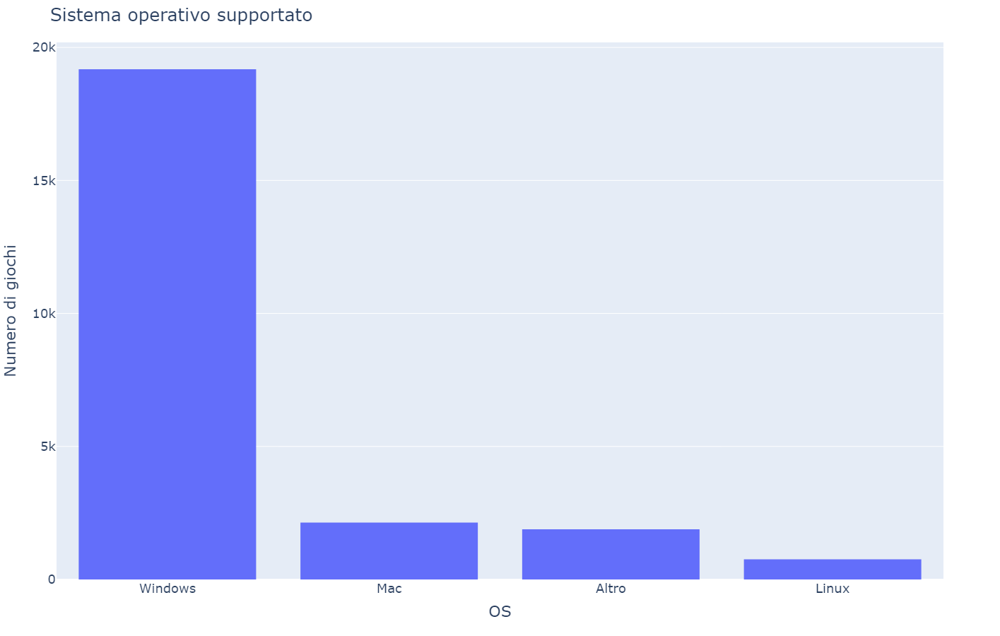

In [24]:
dfOS=df
dfOS=dfOS.dropna(subset=['minimum_requirements'])
dfOS['OS']="Altro"
dfOS.loc[dfOS['minimum_requirements'].str.contains("Windows", case=False),"OS"]="Windows"
dfOS.loc[dfOS['minimum_requirements'].str.contains("Linux", case=False),"OS"]+=",Linux"
dfOS.loc[dfOS['minimum_requirements'].str.contains("Mac", case=False),"OS"]+=",Mac"
dfOS["OS"]=dfOS["OS"].str.split(",")
dfOSExplode=dfOS.explode('OS')

dfgroup= dfOSExplode.groupby('OS')['name'].count()
dfgroup=dfgroup.sort_values(ascending=False).to_frame(name="count")
dfgroup
fig = px.histogram(dfgroup, x=dfgroup.index, y="count",
                   height=900,
                  )
fig=fig.update_layout(
    title="Sistema operativo supportato",
    yaxis_title="Numero di giochi",
    font=dict(
        size=18,
    )
)

fig.show()


## rapporto sconto e prezzo originale

In [25]:

filteredPrice=filteredPrice.dropna(subset=['discount_price'])

filteredPrice=filteredPrice.loc[filteredPrice["discount_price"].str.contains("$")|filteredPrice["discount_price"].str.contains("Free") ,:]
filteredPrice['discount_price'] = filteredPrice['discount_price'].dropna().str.replace("$","",regex=True).dropna().str.replace("$","",regex=True)
filteredPrice=filteredPrice.dropna(subset=['discount_price'])
filteredPrice.loc[filteredPrice["discount_price"].str.contains("Free"),:]='0'
filteredPrice['discount_price']=pd.to_numeric(filteredPrice['discount_price'],errors='coerce')
filteredPrice=filteredPrice.dropna(subset=['discount_price']).loc[filteredPrice['discount_price']<10000,:]
filteredPrice=filteredPrice.loc[filteredPrice["discount_price"]<filteredPrice["original_price"],:]
filteredPrice=filteredPrice.loc[filteredPrice["original_price"]<100,:]
#filteredPrice.sort_values(by="original_price",ascending=True)

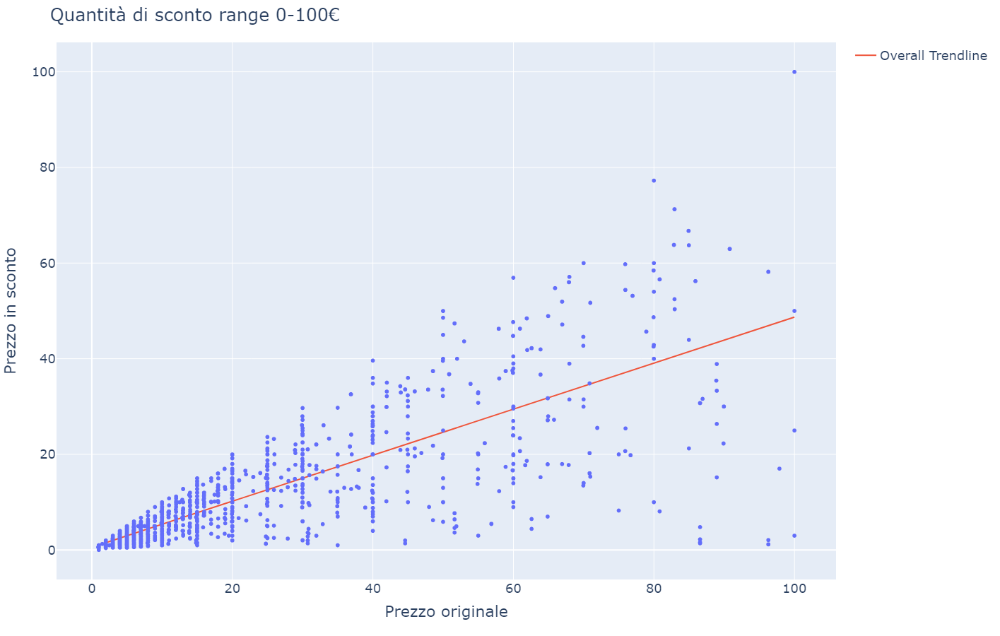

In [26]:
fig=px.scatter(filteredPrice,x="original_price",y="discount_price", height=900, trendline="ols", trendline_scope="overall")

fig.update_layout(
    title="Quantità di sconto range 0-100€",
    xaxis_title="Prezzo originale",
    yaxis_title="Prezzo in sconto",
    font=dict(
        size=18,
    )
)

fig.show()


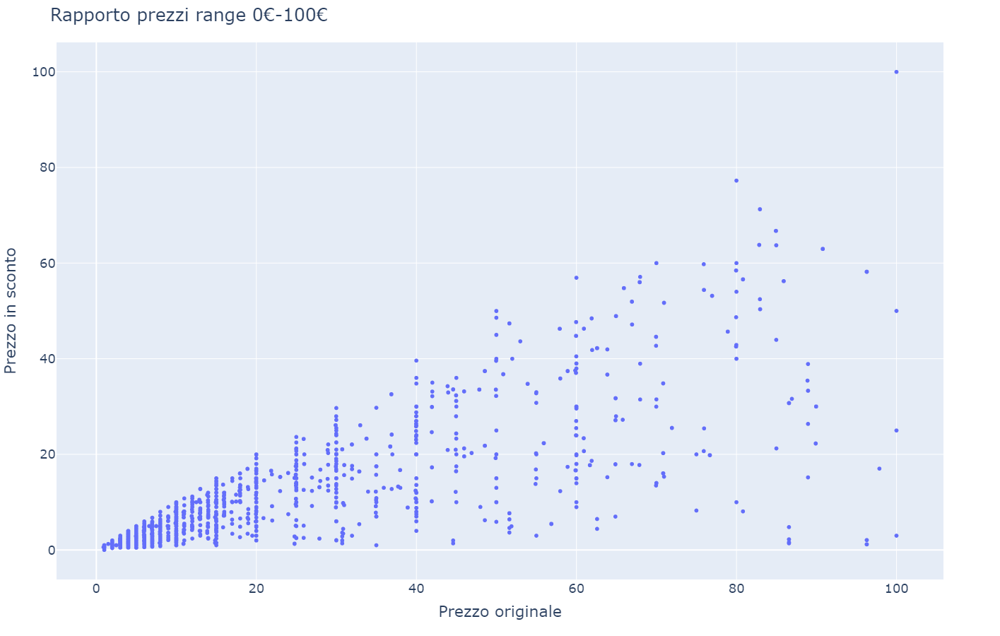

In [27]:
fig=px.scatter(filteredPrice.loc[(filteredPrice["original_price"]<100) & (filteredPrice["discount_price"]<100) ],x="original_price",y="discount_price", height=900)

fig.update_layout(
    title="Rapporto prezzi range 0€-100€",
    xaxis_title="Prezzo originale",
    yaxis_title="Prezzo in sconto",
    font=dict(
        size=18,
    )
    
)

fig.show()


## chi ha pubblicato più giochi

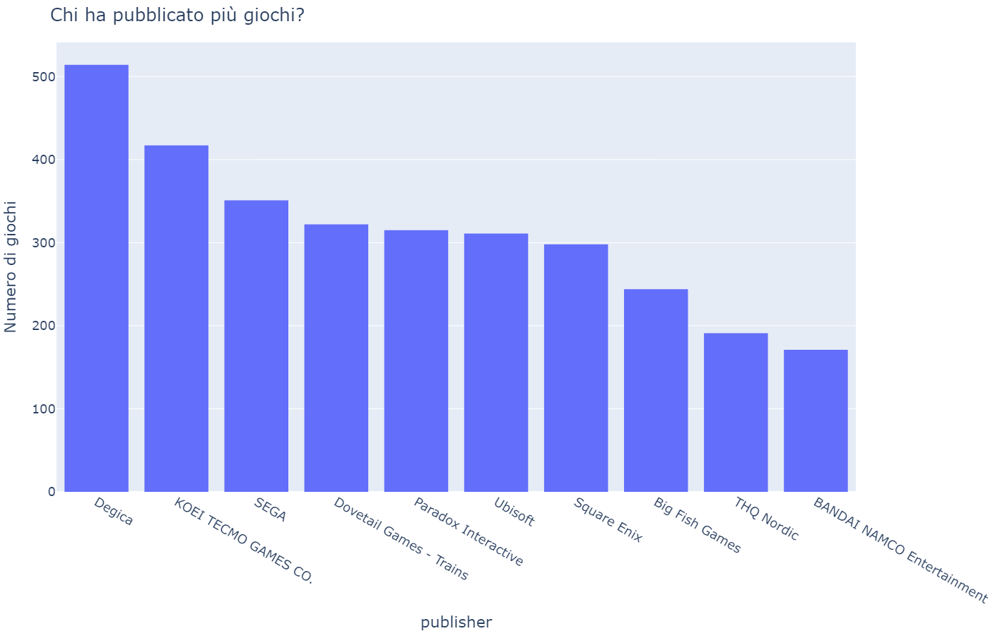

In [28]:
dfpublisher=df
dfpublisher.dropna(subset=['publisher'])
dfpublisher['publisher']=dfpublisher["publisher"].str.split(",").str[0]

dfgroup= dfpublisher.groupby('publisher')['name'].count()
dfgroup=dfgroup.sort_values(ascending=False).to_frame(name="count")
dfgroup=dfgroup.head(10)

fig=px.histogram(dfgroup, x=dfgroup.index, y="count", height=900)

fig.update_layout(
    title="Chi ha pubblicato più giochi?",
    yaxis_title="Numero di giochi",
    font=dict(
        size=18,
    )
)
fig.show()


In [29]:
#df.columns

## Media lunghezza nomi per genere

In [30]:
dfgenreExplode["nameLength"]=dfgenreExplode["name"].str.len()
dfgenrePlot=dfgenreExplode.loc[:,["genre","name","nameLength"]]
dfgroup= dfgenrePlot.groupby('genre')['nameLength'].count()
dfgroup2= dfgenrePlot.groupby('genre')['nameLength'].mean()
dfgroup=pd.merge(dfgroup,dfgroup2,on='genre')
dfgroup=dfgroup.loc[dfgroup["nameLength_x"]>400].sort_values(by="nameLength_x",ascending=False)
dfgroup

,nameLength_x,nameLength_y
genre,,
Indie,24684,21.880003
Action,16558,22.929641
Adventure,13106,23.310468
Casual,13082,24.433649
Simulation,9491,30.303761
Strategy,8818,28.247902
RPG,7595,28.932719
Early Access,2992,15.855949
Free to Play,2687,25.326014


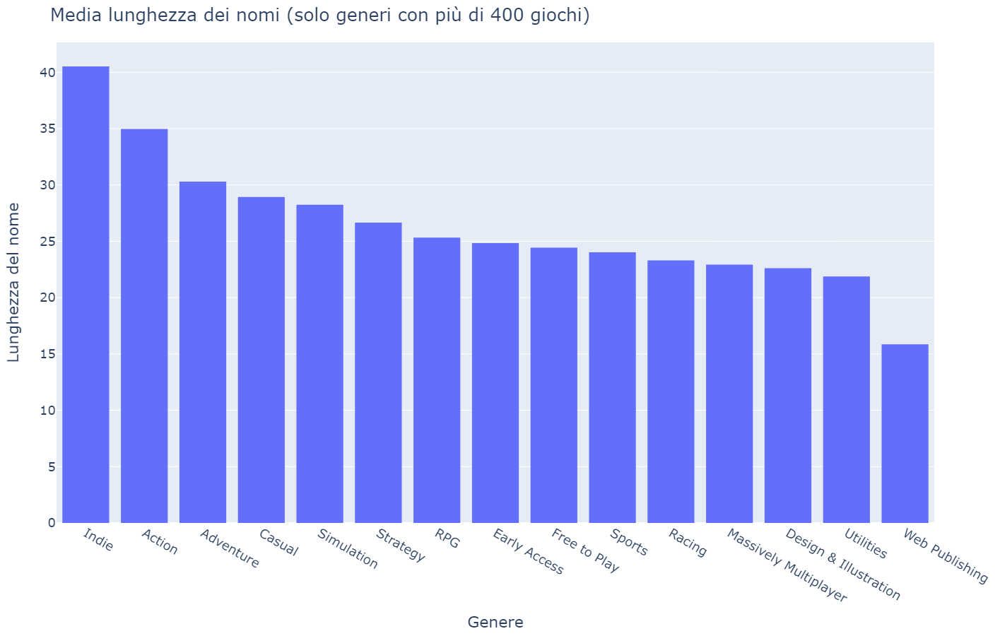

In [31]:
fig= px.histogram(dfgroup.sort_values(by="nameLength_y", ascending=False), x=dfgroup.index, y="nameLength_y", height=900)

fig.update_layout(
    title="Media lunghezza dei nomi (solo generi con più di 400 giochi)",
    xaxis_title="Genere",
    yaxis_title="Lunghezza del nome",
    font=dict(
        size=18,
    )
)
fig.show()

## Evoluzione dei primi 7 generi nel tempo

In [32]:
dfGenreDate=dfrelease_date
dfGenreDate["year"]=dfGenreDate["release_date"].dt.year

C:\Users\adria\AppData\Local\Temp\ipykernel_41040\538590663.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [33]:
dfGenreDate= dfGenreDate.dropna(subset=['genre'])

dfGenreDate["genre"]=dfGenreDate["genre"].astype(str)
dfGenreDate["genre"]=dfGenreDate["genre"].str.split(",")
dfGenreDateExplode=dfGenreDate.explode('genre')
dfGenreDateExplode.sort_values(by='year')
dfGenreDateExplode.reset_index(drop=True)


C:\Users\adria\AppData\Local\Temp\ipykernel_41040\2601846663.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\adria\AppData\Local\Temp\ipykernel_41040\2601846663.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,url,types,name,desc_snippet,recent_reviews,all_reviews,release_date,developer,publisher,popular_tags,...,languages,achievements,genre,game_description,mature_content,minimum_requirements,recommended_requirements,original_price,discount_price,year
0,https://store.steampowered.com/app/379720/DOOM/,app,DOOM,Now includes all three premium DLC packs (Unto...,"Very Positive,(554),- 89% of the 554 user revi...","Very Positive,(42,550),- 92% of the 42,550 use...",2016-05-12,id Software,"Bethesda Softworks,Bethesda Softworks","FPS,Gore,Action,Demons,Shooter,First-Person,Gr...",...,"English,French,Italian,German,Spanish - Spain,...",54.0,Action,"About This Game Developed by id software, the...",NaN,"Minimum:,OS:,Windows 7/8.1/10 (64-bit versions...","Recommended:,OS:,Windows 7/8.1/10 (64-bit vers...",$19.99,$14.99,2016
1,https://store.steampowered.com/app/578080/PLAY...,app,PLAYERUNKNOWN'S BATTLEGROUNDS,PLAYERUNKNOWN'S BATTLEGROUNDS is a battle roya...,"Mixed,(6,214),- 49% of the 6,214 user reviews ...","Mixed,(836,608),- 49% of the 836,608 user revi...",2017-12-21,PUBG Corporation,"PUBG Corporation,PUBG Corporation","Survival,Shooter,Multiplayer,Battle Royale,PvP...",...,"English,Korean,Simplified Chinese,French,Germa...",37.0,Action,About This Game PLAYERUNKNOWN'S BATTLEGROUND...,Mature Content Description The developers de...,"Minimum:,Requires a 64-bit processor and opera...","Recommended:,Requires a 64-bit processor and o...",$29.99,NaN,2017
2,https://store.steampowered.com/app/578080/PLAY...,app,PLAYERUNKNOWN'S BATTLEGROUNDS,PLAYERUNKNOWN'S BATTLEGROUNDS is a battle roya...,"Mixed,(6,214),- 49% of the 6,214 user reviews ...","Mixed,(836,608),- 49% of the 836,608 user revi...",2017-12-21,PUBG Corporation,"PUBG Corporation,PUBG Corporation","Survival,Shooter,Multiplayer,Battle Royale,PvP...",...,"English,Korean,Simplified Chinese,French,Germa...",37.0,Adventure,About This Game PLAYERUNKNOWN'S BATTLEGROUND...,Mature Content Description The developers de...,"Minimum:,Requires a 64-bit processor and opera...","Recommended:,Requires a 64-bit processor and o...",$29.99,NaN,2017
3,https://store.steampowered.com/app/578080/PLAY...,app,PLAYERUNKNOWN'S BATTLEGROUNDS,PLAYERUNKNOWN'S BATTLEGROUNDS is a battle roya...,"Mixed,(6,214),- 49% of the 6,214 user reviews ...","Mixed,(836,608),- 49% of the 836,608 user revi...",2017-12-21,PUBG Corporation,"PUBG Corporation,PUBG Corporation","Survival,Shooter,Multiplayer,Battle Royale,PvP...",...,"English,Korean,Simplified Chinese,French,Germa...",37.0,Massively Multiplayer,About This Game PLAYERUNKNOWN'S BATTLEGROUND...,Mature Content Description The developers de...,"Minimum:,Requires a 64-bit processor and opera...","Recommended:,Requires a 64-bit processor and o...",$29.99,NaN,2017
4,https://store.steampowered.com/app/637090/BATT...,app,BATTLETECH,Take command of your own mercenary outfit of '...,"Mixed,(166),- 54% of the 166 user reviews in t...","Mostly Positive,(7,030),- 71% of the 7,030 use...",2018-04-24,Harebrained Schemes,"Paradox Interactive,Paradox Interactive","Mechs,Strategy,Turn-Based,Turn-Based Tactics,S...",...,"English,French,German,Russian",128.0,Action,About This Game From original BATTLETECH/Mec...,NaN,"Minimum:,Requires a 64-bit processor and opera...","Recommended:,Requires a 64-bit processor and o...",$39.99,NaN,2018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92449,https://store.steampowered.com/app/906840/Fant...,app,Fantasy Grounds - Quests of Doom 4: A Midnight...,NaN,NaN,NaN,2018-07-31,"SmiteWorks USA, LLC",NaN,"RPG,Indie,Strategy,Software,Turn-Based,Fantasy...",...,English,NaN,RPG,About This Content Quests of Doom 4: A Midni...,NaN,"Minimum:,OS:,Windows 7x , 8x or 10x,Processor:...","Recommended:,OS:,Windows 7x , 8x or 10x,Proces...",$7.99,NaN,2018
92450,https://store.steampowered.com/app/906840/Fant...,app,Fantasy Grounds - Quests of Doom 4: A Midnight...,NaN,NaN,NaN,2018-07-31,"SmiteWorks USA, LLC",NaN,"RPG,Indie,Strategy,Soft

In [34]:
dfall_reviewsWithGenreTest=dfall_reviewsWithGenre.groupby(['genre'])['name'].count().reset_index(
  name='Count').sort_values(['Count'], ascending=False).head(7)


dfall_reviewsWithGenreMerge=pd.merge(dfall_reviewsWithGenreTest,dfGenreDateExplode,on="genre")

In [35]:
dfall_reviewsWithGenreMerge=dfall_reviewsWithGenreMerge.loc[dfall_reviewsWithGenreMerge["year"]<2019]

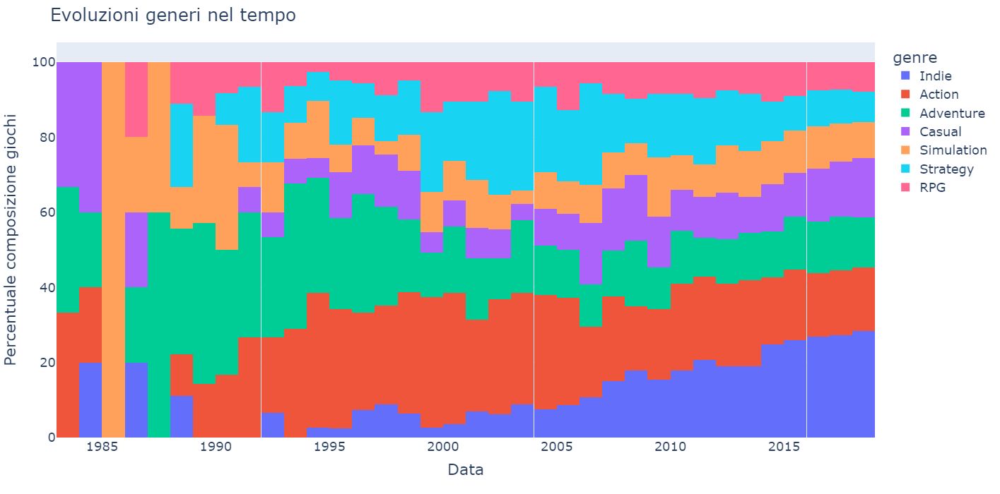

In [36]:
#fig = px.histogram(dfGenreDateExplode, x="genre", animation_frame="year", color="genre")




fig = px.histogram(dfall_reviewsWithGenreMerge, x="release_date", color="genre", nbins=50,barnorm = "percent", height=700)

fig.update_layout(
    title="Evoluzioni generi nel tempo",
    xaxis_title="Data",
    yaxis_title="Percentuale composizione giochi",
    font=dict(
        size=18,
    )
)




#fig["layout"].pop("updatemenus") # optional, drop animation buttons
fig.show()

## Animazione crescita generi nel tempo

In [37]:
for year in range(dfGenreDateExplode.year.min(),dfGenreDateExplode.year.max()):
    dfGenreDateExplode.loc[dfGenreDateExplode["year"]==year,"count"]=dfGenreDateExplode.loc[dfGenreDateExplode["year"]==year,"name"].count()
    
 #dfGenreDateExplode["count"]
    #for x in 

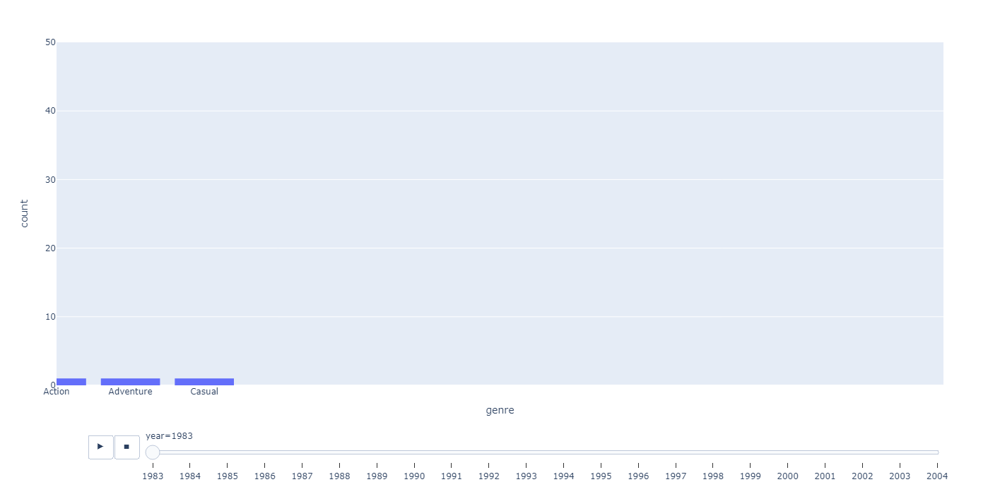

In [38]:
dfGenreDateExplode=dfGenreDateExplode.dropna(subset=['count']).sort_values(by=['year', 'count']);
fig = px.histogram(dfGenreDateExplode.loc[dfGenreDateExplode["year"]<2005,:], animation_frame="year", x="genre",height=700)


fig.update_layout(xaxis_range=(0, 12),
                 yaxis_range=(0, 50))

fig.show()